## Boston Crime Data Analysis

In this analysis, we perform advanced analysis of certain crime reports extensively reported in 2017. In this notebook, we use Folium for plotting the grographical map of Boston with a mix of heatmap to determine the hot spots of Boston. We would like to determine which offense occurs the most and in which location of Boston. 

In [ ]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 

In [110]:
data = pd.read_csv('C:/Users/SwetaMankala/OneDrive - Northeastern University/XN Project/BostonCrimeData.csv', low_memory=False, delimiter=',', encoding='ISO-8859-1')

In [111]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 478811 entries, 0 to 478810
Data columns (total 19 columns):
INCIDENT_NUMBER        478811 non-null object
OFFENSE_CODE           478811 non-null int64
OFFENSE_NAME           475579 non-null object
OFFENSE_CODE_GROUP     426839 non-null object
OFFENSE_DESCRIPTION    478811 non-null object
DISTRICT               476419 non-null object
District Name          476317 non-null object
REPORTING_AREA         478811 non-null object
SHOOTING               53718 non-null object
OCCURRED_ON_DATE       478811 non-null object
YEAR                   478811 non-null int64
MONTH                  478811 non-null int64
DAY_OF_WEEK            478811 non-null object
HOUR                   478811 non-null int64
UCR_PART               426729 non-null object
STREET                 461788 non-null object
Lat                    450579 non-null float64
Long                   450579 non-null float64
Location               478811 non-null object
dtypes: float64(2)

In [112]:
data.columns

Index(['INCIDENT_NUMBER', 'OFFENSE_CODE', 'OFFENSE_NAME', 'OFFENSE_CODE_GROUP',
       'OFFENSE_DESCRIPTION', 'DISTRICT', 'District Name', 'REPORTING_AREA',
       'SHOOTING', 'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR',
       'UCR_PART', 'STREET', 'Lat', 'Long', 'Location'],
      dtype='object')

In [113]:
data.describe()

,OFFENSE_CODE,YEAR,MONTH,HOUR,Lat,Long
count,478811.000000,478811.000000,478811.000000,478811.000000,450579.000000,450579.000000
mean,2332.400041,2017.356166,6.622271,13.095119,42.232743,-70.938786
std,1182.382763,1.437909,3.421483,6.325004,1.964248,3.177463
min,111.000000,2015.000000,1.000000,0.000000,-1.000000,-71.244055
25%,1102.000000,2016.000000,4.000000,9.000000,42.297027,-71.097412
50%,3005.000000,2017.000000,7.000000,14.000000,42.325475,-71.077706
75%,3201.000000,2019.000000,10.000000,18.000000,42.348406,-71.062563
max,3831.000000,2020.000000,12.000000,23.000000,42.449840,0.000000


In [114]:
data.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_NAME,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,District Name,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I92102201,3301,VERBAL DISPUTE,NaN,VERBAL DISPUTE,E13,Jamaica Plain,583,0,12/20/2019 3:08,2019,12,Friday,3,NaN,DAY ST,42.325122,-71.107779,"(42.32512200, -71.10777900)"
1,I92097173,3115,INVESTIGATE PERSON,NaN,INVESTIGATE PERSON,C11,Dorchester,355,0,10/23/2019 0:00,2019,10,Wednesday,0,NaN,GIBSON ST,42.297555,-71.059709,"(42.29755500, -71.05970900)"
2,I92094519,3126,NaN,NaN,WARRANT ARREST - OUTSIDE OF BOSTON WARRANT,D14,Brighton,765,0,11/22/2019 7:50,2019,11,Friday,7,NaN,BROOKS ST,42.355120,-71.162678,"(42.35512000, -71.16267800)"
3,I92089785,3005,NaN,NaN,SICK ASSIST,E13,Jamaica Plain,574,0,11/5/2019 18:00,2019,11,Tuesday,18,NaN,WASHINGTON ST,42.309718,-71.104294,"(42.30971800, -71.10429400)"
4,I90583827,1402,VANDALISM,NaN,VANDALISM,E18,Hyde Park,498,0,11/2/2019 5:09,2019,11,Saturday,5,NaN,BRADLEE ST,42.271616,-71.118074,"(42.27161600, -71.11807400)"


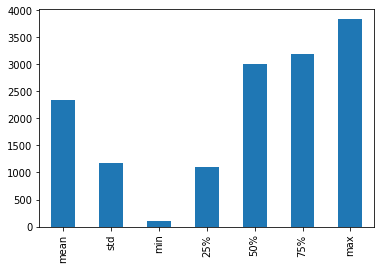

In [115]:
data.describe().drop('count')['OFFENSE_CODE'].plot(kind='bar')
plt.show()

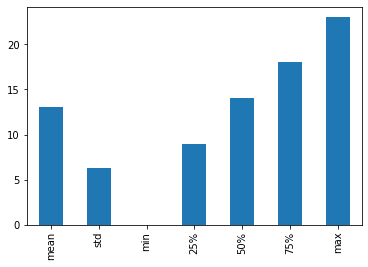

In [116]:
data.describe().drop('count')['HOUR'].plot(kind='bar')
plt.show()

The columns INCIDENT_NUMBER does not contribute much to the analysis. Also, the column OCCURRED_ON_DATE is a duplicate as we have variables such as YEAR, MONTH and DAY to perform further analysis.

In [103]:
data = data.drop(columns=['INCIDENT_NUMBER','OCCURRED_ON_DATE'])

In [117]:
data.tail(20)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_NAME,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,District Name,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
478791,182095257,3125,WARRANT ARREST,NaN,WARRANT ARREST - BOSTON WARRANT (MUST BE SUPPL...,E5,West Roxbury,723,0,10/10/2019 14:56,2019,10,Thursday,14,NaN,VFW PARKWAY,NaN,NaN,"(0.00000000, 0.00000000)"
478792,182083750,3125,WARRANT ARREST,NaN,WARRANT ARREST - BOSTON WARRANT (MUST BE SUPPL...,A15,Charlestown,,0,10/2/2019 22:15,2019,10,Wednesday,22,NaN,1ST AVE,NaN,NaN,"(0.00000000, 0.00000000)"
478793,182068882,3125,WARRANT ARREST,NaN,WARRANT ARREST - BOSTON WARRANT (MUST BE SUPPL...,C6,South Boston,177,0,10/1/2019 8:45,2019,10,Tuesday,8,NaN,MASSACHUSETTS AVE,42.327799,-71.067710,"(42.32779900, -71.06771000)"
478794,172098609,1810,DRUGS - SALE / MANUFACTURING,NaN,DRUGS - POSSESSION/ SALE/ MANUFACTURING/ USE,C11,Dorchester,355,0,10/1/2019 9:00,2019,10,Tuesday,9,NaN,DORCHESTER AVE,42.298392,-71.060708,"(42.29839200, -71.06070800)"
478795,172096419,3126,NaN,NaN,WARRANT ARREST - OUTSIDE OF BOSTON WARRANT,A15,Charlestown,900,0,10/1/2019 1:47,2019,10,Tuesday,1,NaN,POLK ST,42.379126,-71.061226,"(42.37912600, -71.06122600)"
478796,172044761,3125,WARRANT ARREST,NaN,WARRANT ARREST - BOSTON WARRANT (MUST BE SUPPL...,B2,Roxbury,332,0,10/21/2019 19:15,2019,10,Monday,19,NaN,COLUMBIA RD,42.315196,-71.066783,"(42.31519600, -71.06678300)"
478797,162090163,1001,FORGERY / COUNTERFEITING,NaN,FORGERY / COUNTERFEITING,C11,Dorchester,358,0,10/9/2019 20:14,2019,10,Wednesday,20,NaN,WASHINGTON ST,42.355123,-71.060879,"(42.35512300, -71.06087900)"
478798,129100024,3201,PROPERTY - LOST,NaN,PROPERTY - LOST/ MISSING,B2,Roxbury,612,0,12/12/2019 10:40,2019,12,Thursday,10,NaN,LONGWOOD AVE,42.337441,-71.104280,"(42.33744100, -71.10428000)"
478799,129099936,1106,FRAUD - CREDIT CARD / ATM FRAUD,NaN,FRAUD - CREDIT CARD / ATM FRAUD,B2,Roxbury,288,0,11/29/2019 6:00,2019,11,Friday,6,NaN,WASHINGTON ST,42.329748,-71.084540,"(42.32974800, -71.08454000)"
478800,129099920,3301,VERBAL DISPUTE,NaN,VERBAL DISPUTE,B2,Roxbury,330,0,12/12/2019 7:50,2019,12,Thursday,7,NaN,COLUMBIA ROAD,NaN,NaN,"(0.00000000, 0.00000000)"


In [118]:
data.isnull().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_NAME             3232
OFFENSE_CODE_GROUP      51972
OFFENSE_DESCRIPTION         0
DISTRICT                 2392
District Name            2494
REPORTING_AREA              0
SHOOTING               425093
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                52082
STREET                  17023
Lat                     28232
Long                    28232
Location                    0
dtype: int64

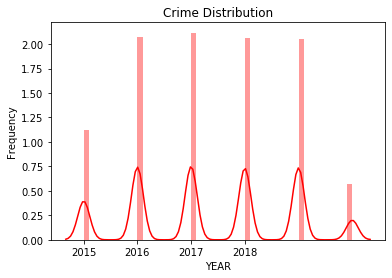

In [119]:
sns.distplot(data['YEAR'], color="red")
plt.ylabel('Frequency')
plt.title('Crime Distribution')
plt.xticks(list(range(2015,2019,1)))
plt.show()

We can notice an increased number of crimes around the year 2017.

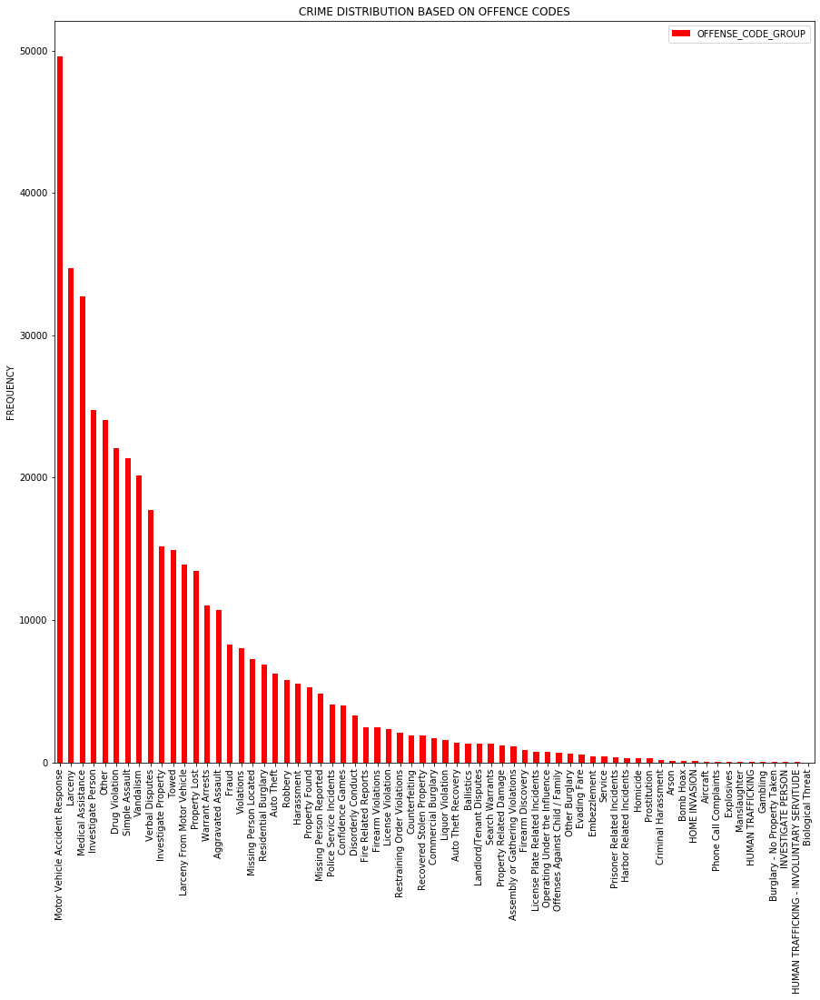

In [120]:
fig = plt.figure(figsize=(15,15))
plt.title('CRIME DISTRIBUTION BASED ON OFFENCE CODES')
plt.ylabel('FREQUENCY')
data['OFFENSE_CODE_GROUP'].value_counts().plot(kind='bar', color='red')
plt.legend()
plt.show()

Motor Vehicle Accident and Larceny are the most common type of serious crimes that occur while crimes such as Burglary, Human Trafficking and Biological Threats are pretty rare.

In [128]:
#df = pd.DataFrame(data)
data['OCCURRED_ON_DATE'] = pd.to_datetime(data['OCCURRED_ON_DATE'])

In [130]:
data['Day_of_year'] = data['OCCURRED_ON_DATE'].dt.dayofyear
data_holidays = data[data.YEAR == 2017].groupby(['Day_of_year']).size().reset_index(name='counts')

According to experts, the rate of crimes occurring is high around holidays and the most common crimes are robbery and larceny. The occurence of these crimes could be due to crowded shopping, increase alcohol-drug uses on holidays such as St. Patrick's day that could raise conflicts etc. 

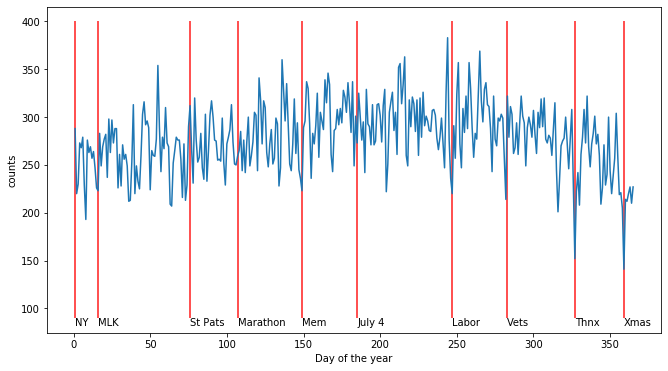

In [152]:
# Dates of major U.S. holidays in 2017
holidays = pd.Series(['2017-01-01', # New Years Day
                     '2017-01-16', # MLK Day
                     '2017-03-17', # St. Patrick's Day
                     '2017-04-17', # Boston marathon
                     '2017-05-29', # Memorial Day
                     '2017-07-04', # Independence Day
                     '2017-09-04', # Labor Day
                     '2017-10-10', # Veterans Day
                     '2017-11-23', # Thanksgiving
                     '2017-12-25']) # Christmas
holidays = pd.to_datetime(holidays).dt.dayofyear
holidays_names = ['NY',
                 'MLK',
                 'St Pats',
                 'Marathon',
                 'Mem',
                 'July 4',
                 'Labor',
                 'Vets',
                 'Thnx',
                 'Xmas']

import datetime as dt
# Plot crimes and holidays
fig, ax = plt.subplots(figsize=(11,6))
sns.lineplot(x='Day_of_year',
            y='counts',
            ax=ax,
            data=data_holidays)
plt.xlabel('Day of the year')
plt.vlines(holidays, 400, 90, alpha=0.9, color ='r')
for i in range(len(holidays)):
    plt.text(x=holidays[i], y=82, s=holidays_names[i])

From the above graph, we can infer that the rate of crimes that occur in the city of Boston are more around the holidays that vary before and after. Although most of the crimes seem to have an increased rate of occurence around holidays, the rate of it happening during Thanksgiving and Christmas is pretty low compared to the season of summer.

In [173]:
!pip install folium

In [174]:
import folium
from folium.plugins import HeatMap

# Create basic Folium crime map
crime_map = folium.Map(location=[42.3125,-71.0875], 
                       tiles = "Stamen Toner",
                      zoom_start = 11)

# Add data for heatmp 
data_heatmap = data[data.YEAR == 2017]
data_heatmap = data[['Lat','Long']]
data_heatmap = data.dropna(axis=0, subset=['Lat','Long'])
data_heatmap = [[row['Lat'],row['Long']] for index, row in data_heatmap.iterrows()]
HeatMap(data_heatmap, radius=10).add_to(crime_map)

# Plot!
crime_map

The heatmap depicted above shows the hotspots that are present in the city with Street view showing the crimes that have occurred in the year 2017. Most of the crimes occur in Newburry Street, Boylston Street, State Street and Downtown Crossing.

In [182]:
import folium
from folium.plugins import HeatMap

map_hooray = folium.Map(location=[42.361145,-71.057083],
                    zoom_start = 12, min_zoom=12, tiles= "Stamen Toner" ) #Giving the location just write boston coordinat to google

heat_df = data[(data['YEAR']==2017 )& (data['OFFENSE_CODE_GROUP']=='Larceny')]# I take 2017 cause there is more crime against to other years
# heat_df = data[data['Group']=='Larceny'] 
heat_df = heat_df[['Lat', 'Long']] #giving only latitude and longitude now in heat_df just latitude and longitude
                                        #from 2017 larceny responde
heat_df=heat_df.dropna()
folium.CircleMarker([42.356145,-71.064083],
                    radius=50,
                    popup='Motor Vehicle Accident Response',
                    color='red',
                    ).add_to(map_hooray) #Adding mark on the map but it's hard to find correct place. 
                                         #it's take to muhc time
    
    
heat_data = [[row['Lat'],row['Long']] for index, row in heat_df.iterrows()]
#We have to give latitude and longitude like this [[lat, lon],[lat, lon],[lat, lon],[lat, lon],[lat, lon]]

HeatMap(heat_data, radius=10).add_to(map_hooray) #Adding map_hooray to HeatMap
map_hooray #Plotting